In [1]:
import nibabel, nipy, nilearn
from nipy.labs.mask import compute_mask
from nilearn.masking import compute_epi_mask
from nilearn.image import mean_img, new_img_like
import pylab as plt
import seaborn as sns
from nilearn.plotting import plot_epi, plot_anat, plot_roi
import numpy as np
%matplotlib inline

/home/oesteban/miniconda2/envs/nipypedev-3.5/lib/python3.5/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


In [2]:
compute_mask?

In [6]:
in_file = "data/sub-ben01_task-unknown_bold.nii.gz"

In [7]:
in_4d_nii = nibabel.load(in_file)

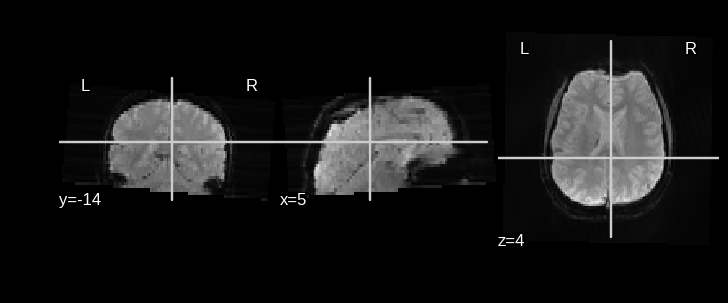

In [8]:
mean_nii = mean_img(in_4d_nii)
plot_anat(mean_nii)

/home/oesteban/miniconda2/envs/nipypedev-3.5/lib/python3.5/site-packages/nipy/labs/mask.py:235: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  delta = sorted_input[limiteinf + 1:limitesup + 1] \
/home/oesteban/miniconda2/envs/nipypedev-3.5/lib/python3.5/site-packages/nipy/labs/mask.py:236: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  - sorted_input[limiteinf:limitesup]
/home/oesteban/miniconda2/envs/nipypedev-3.5/lib/python3.5/site-packages/nipy/labs/mask.py:238: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  threshold = 0.5 * (sorted_input[ia + limiteinf]
/home/oesteban/miniconda2/envs/nipypedev-3.5/lib/python3.5/site-packages/nipy/labs/mask.py:239: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  + sorted_input[i

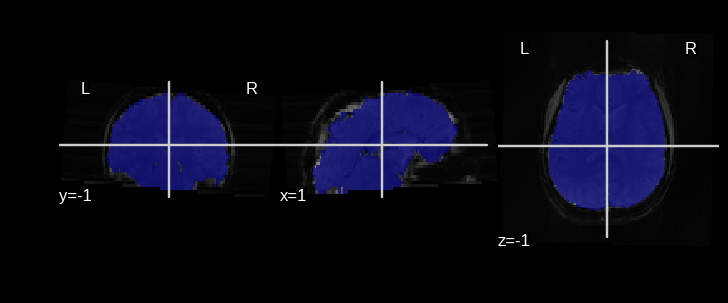

In [9]:
#mask_nii = compute_epi_mask(in_4d_nii)

mask_data = compute_mask(mean_nii.get_data())
mask_nii = new_img_like(mean_nii, mask_data)

plot_roi(mask_nii, mean_nii)

In [10]:
a = np.where(mask_nii.get_data() != 0)
bbox = np.max(a[0]) - np.min(a[0]), np.max(a[1]) - np.min(a[1]), np.max(a[2]) - np.min(a[2])
print(bbox)
print(np.argmax(bbox))
longest_axis = np.argmax(bbox)

(72, 90, 30)
1


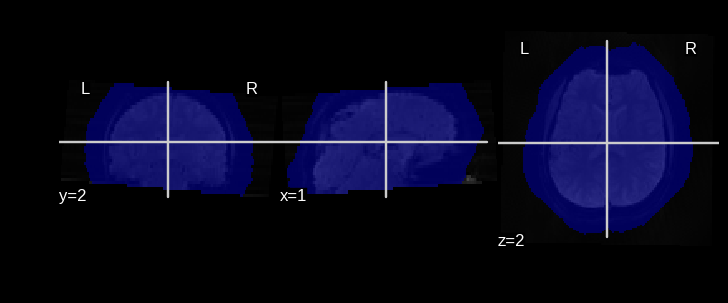

In [11]:
from scipy import ndimage

# Input here is a binarized and intersected mask data from previous section
dil_mask = ndimage.binary_dilation(mask_nii.get_data(), iterations=int(mask_nii.shape[longest_axis]/8))

# Now, we visualize the same using `plot_roi` with data being converted to Nifti
# image. In all new image like, reference image is the same but second argument
# varies with data specific
dil_mask_nii = new_img_like(
    mask_nii,
    dil_mask.astype(np.int))
plot_roi(dil_mask_nii, mean_nii)

In [12]:
dil_mask.shape

(128, 128, 33)

In [13]:
rep = list(mask_nii.shape)
rep[longest_axis] = -1
new_mask_2d = dil_mask.max(axis=longest_axis).reshape(rep)
new_mask_2d.shape

(128, 1, 33)

In [14]:
rep = [1,1,1]
rep[longest_axis] = mask_nii.shape[longest_axis]
new_mask_3d = np.logical_not(np.tile(new_mask_2d, rep))
#new_mask_3d = 

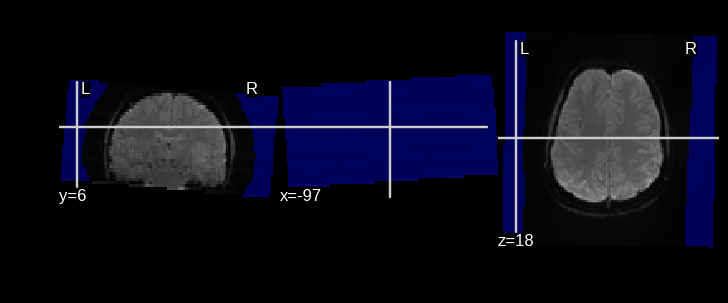

In [15]:
new_mask_nii = new_img_like(
    mask_nii,
    new_mask_3d.astype(np.int))
plot_roi(new_mask_nii, mean_nii)

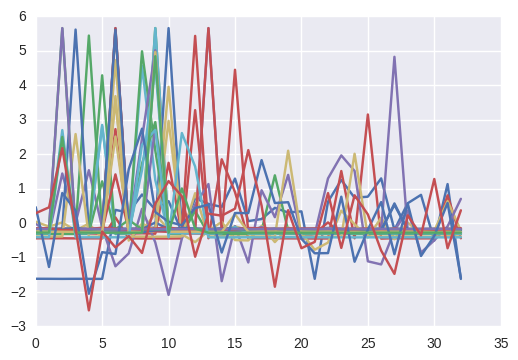

In [16]:
from scipy.stats.mstats import zscore

data4d = in_4d_nii.get_data()
for slice_i in range(in_4d_nii.shape[2]):
    slice_data = data4d[:,:,slice_i,:][new_mask_3d[:,:,slice_i]].mean(axis=0)
    slice_data = zscore(slice_data)
    plt.plot(slice_data)

In [14]:
data4d[:,:,slice_i,:][new_mask_3d[:,:,slice_i]].shape

(6528, 33)

In [15]:
data4d.shape

(128, 128, 33, 33)

In [16]:
compute_mask?

In [27]:
def plot_spikes(in_file, skip=0):
    in_4d_nii = nibabel.load(in_file)
    mean_nii = mean_img(in_4d_nii)
    plot_anat(mean_nii)
    mask_data = compute_mask(mean_nii.get_data())
    mask_nii = new_img_like(mean_nii, mask_data)

    plot_roi(mask_nii, mean_nii)
    
    a = np.where(mask_nii.get_data() != 0)
    bbox = np.max(a[0]) - np.min(a[0]), np.max(a[1]) - np.min(a[1]), np.max(a[2]) - np.min(a[2])
    print(bbox)
    print(np.argmax(bbox))
    longest_axis = np.argmax(bbox)
    
    from scipy import ndimage

    # Input here is a binarized and intersected mask data from previous section
    dil_mask = ndimage.binary_dilation(mask_nii.get_data(), iterations=int(mask_nii.shape[longest_axis]/8))

    # Now, we visualize the same using `plot_roi` with data being converted to Nifti
    # image. In all new image like, reference image is the same but second argument
    # varies with data specific
    dil_mask_nii = new_img_like(
        mask_nii,
        dil_mask.astype(np.int))
    plot_roi(dil_mask_nii, mean_nii)
    
    rep = list(mask_nii.shape)
    rep[longest_axis] = -1
    new_mask_2d = dil_mask.max(axis=longest_axis).reshape(rep)
    new_mask_2d.shape
    
    rep = [1,1,1]
    rep[longest_axis] = mask_nii.shape[longest_axis]
    new_mask_3d = np.logical_not(np.tile(new_mask_2d, rep))
    
    new_mask_nii = new_img_like(
    mask_nii,
    new_mask_3d.astype(np.int))
    plot_roi(new_mask_nii, mean_nii)
    
    from scipy.stats.mstats import zscore

    data4d = in_4d_nii.get_data()[:,:,:,skip:]
    plt.figure()
    for slice_i in range(in_4d_nii.shape[2]):
        slice_data = data4d[:,:,slice_i,:][new_mask_3d[:,:,slice_i]].mean(axis=0)
        #slice_data = zscore(slice_data)
        plt.plot(slice_data)
    plt.title(in_file)

(72, 90, 30)
1


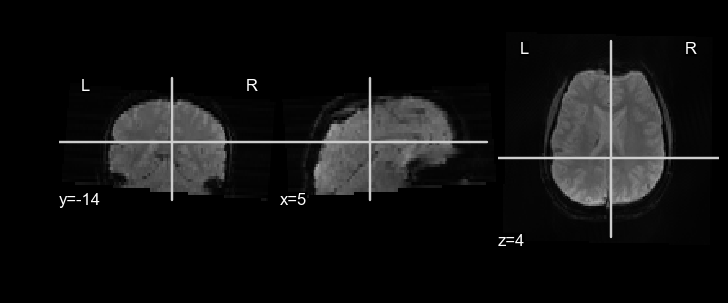

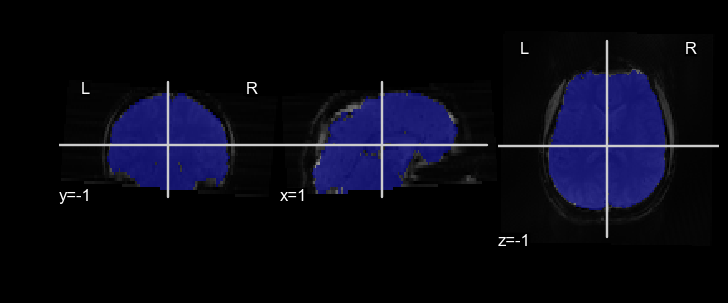

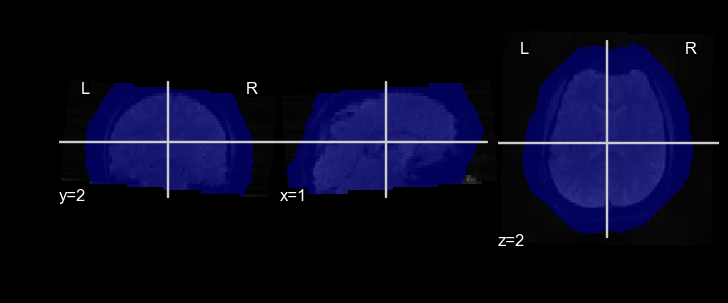

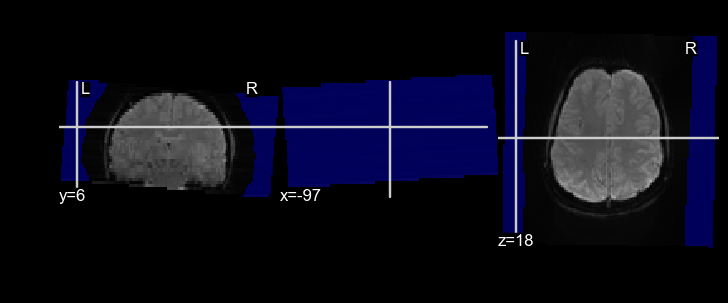

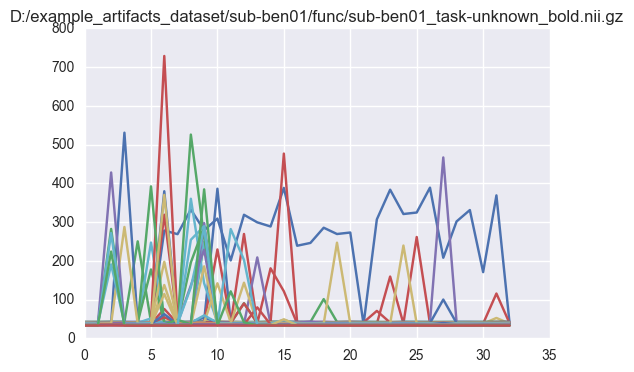

In [28]:
plot_spikes("D:/example_artifacts_dataset/sub-ben01/func/sub-ben01_task-unknown_bold.nii.gz")

In [19]:
from glob import glob

(44, 54, 33)
1
(43, 55, 30)
1
(43, 53, 30)
1
(43, 54, 30)
1


C:\Users\filo\Anaconda3\lib\site-packages\matplotlib\pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


(45, 51, 32)
1
(45, 51, 31)
1
(45, 50, 31)
1
(39, 53, 32)
1
(38, 52, 32)
1
(39, 53, 32)
1
(41, 49, 32)
1
(41, 48, 32)
1
(41, 49, 32)
1
(41, 53, 32)
1
(41, 53, 32)
1
(41, 53, 31)
1
(41, 51, 32)
1
(41, 51, 33)
1
(41, 51, 32)
1
(43, 57, 32)
1
(43, 57, 32)
1
(43, 57, 32)
1
(43, 50, 32)
1
(42, 50, 31)
1
(42, 50, 31)
1
(45, 52, 33)
1
(45, 51, 33)
1
(45, 51, 33)
1
(45, 51, 33)
1
(45, 51, 33)
1
(44, 51, 32)
1
(41, 55, 33)
1
(41, 56, 33)
1
(41, 56, 33)
1
(42, 52, 32)
1
(42, 51, 32)
1
(42, 51, 32)
1
(40, 48, 29)
1
(40, 48, 29)
1
(40, 47, 29)
1
(39, 52, 32)
1
(38, 52, 32)
1
(38, 52, 33)
1
(38, 51, 33)
1
(38, 51, 33)
1
(38, 51, 33)
1
(42, 55, 33)
1
(42, 55, 33)
1
(42, 55, 33)
1
(43, 57, 31)
1
(72, 90, 30)
1
(39, 47, 32)
1
(38, 47, 32)
1
(38, 47, 32)
1
(39, 47, 32)
1
(38, 46, 32)
1
(38, 47, 32)
1
(39, 47, 32)
1
(46, 61, 29)
1
(46, 42, 27)
0
(69, 81, 66)
1


C:\Users\filo\Anaconda3\lib\site-packages\numpy\core\_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)


(69, 81, 66)
1


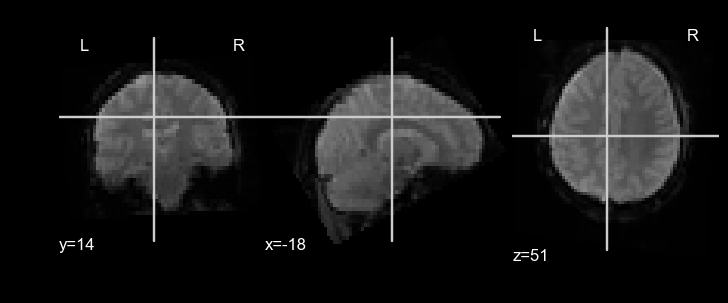

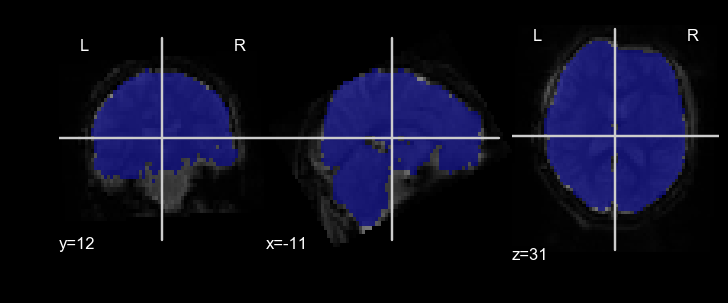

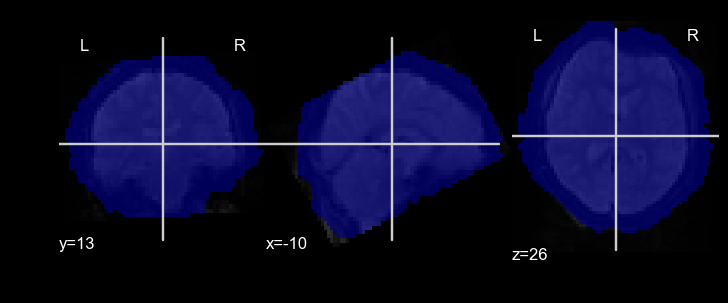

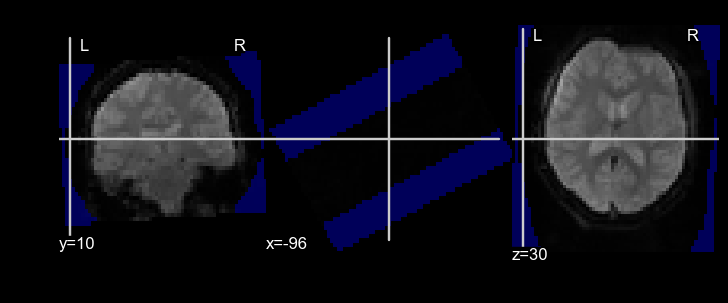

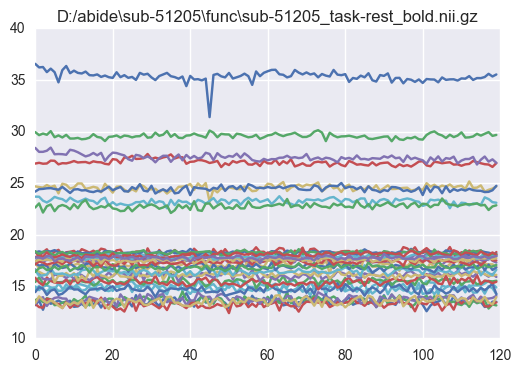

...

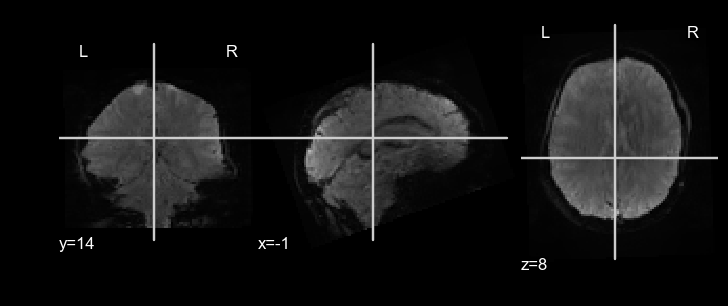

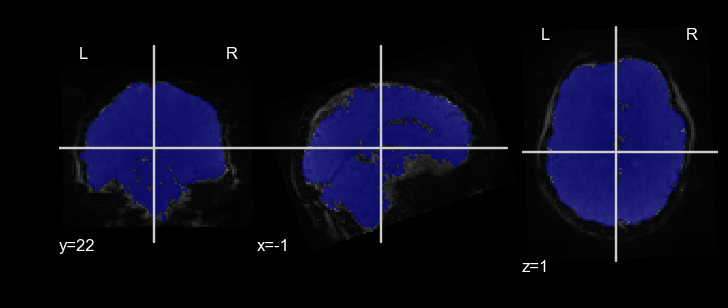

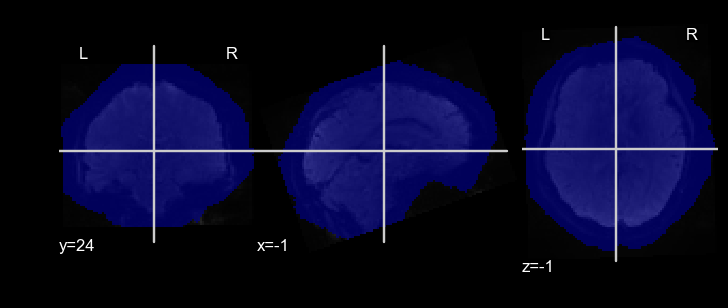

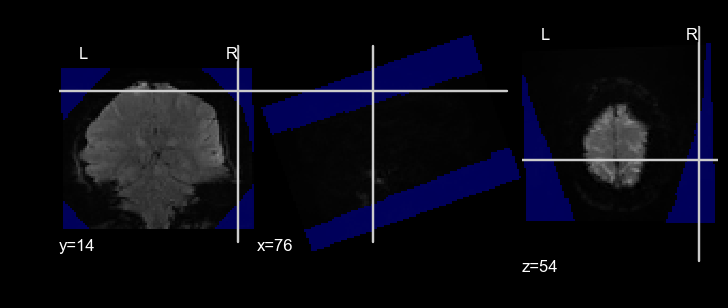

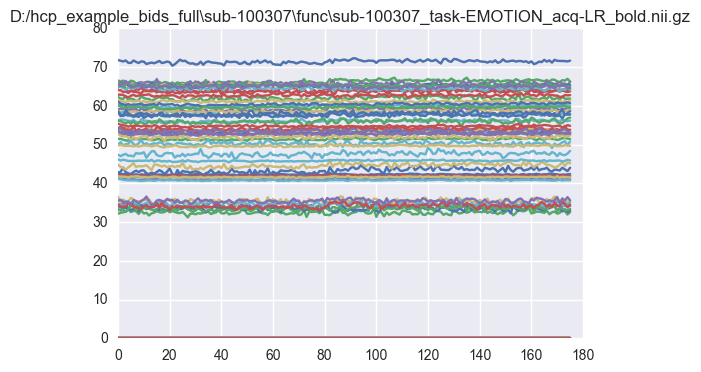

In [22]:
for file in glob("D:/*/sub-*/func/sub-*_task-*_bold.nii.gz"):
    plot_spikes(file)

In [29]:
plot_anat?

In [30]:
glob("D:/*/sub-*/func/sub-*_task-*_bold.nii.gz")

['D:/abide\\sub-51205\\func\\sub-51205_task-rest_bold.nii.gz',
 'D:/ds001\\sub-01\\func\\sub-01_task-balloonanalogrisktask_run-01_bold.nii.gz',
 'D:/ds001\\sub-01\\func\\sub-01_task-balloonanalogrisktask_run-02_bold.nii.gz',
 'D:/ds001\\sub-01\\func\\sub-01_task-balloonanalogrisktask_run-03_bold.nii.gz',
 'D:/ds001\\sub-02\\func\\sub-02_task-balloonanalogrisktask_run-01_bold.nii.gz',
 'D:/ds001\\sub-02\\func\\sub-02_task-balloonanalogrisktask_run-02_bold.nii.gz',
 'D:/ds001\\sub-02\\func\\sub-02_task-balloonanalogrisktask_run-03_bold.nii.gz',
 'D:/ds001\\sub-03\\func\\sub-03_task-balloonanalogrisktask_run-01_bold.nii.gz',
 'D:/ds001\\sub-03\\func\\sub-03_task-balloonanalogrisktask_run-02_bold.nii.gz',
 'D:/ds001\\sub-03\\func\\sub-03_task-balloonanalogrisktask_run-03_bold.nii.gz',
 'D:/ds001\\sub-04\\func\\sub-04_task-balloonanalogrisktask_run-01_bold.nii.gz',
 'D:/ds001\\sub-04\\func\\sub-04_task-balloonanalogrisktask_run-02_bold.nii.gz',
 'D:/ds001\\sub-04\\func\\sub-04_task-balloona